<a href="https://colab.research.google.com/github/akshat09105/AI-ML_leaning_python/blob/main/Regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
# **PyCaret for Regression**
---
- It is a bundle of many Machine Learning algorithms.
- Only three lines of code is required to compare 20 ML models.
- Pycaret is available for:
    - Classification
    - Regression
    - Clustering
---

### **Self learning resource**
1. Tutorial on Pycaret **<a href="https://pycaret.readthedocs.io/en/latest/tutorials.html" target="_blank"> Click Here</a>**

2. Documentation on Pycaret-Regression: **<a href="https://pycaret.readthedocs.io/en/latest/tutorials.html#regression" target="_blank"> Click Here </a>**

---

### **In this tutorial we will learn:**

- Getting Data
- Setting up Environment
- Create Model
- Tune Model
- Plot Model
- Finalize Model
- Predict Model
- Save / Load Model
---



### **(a) Install Pycaret**

In [78]:
!pip install --force-reinstall --no-cache-dir numpy==1.26.4 scipy==1.11.4 pandas==1.5.3

# This installation will ask for Restart the session; Click on "Restart Session"


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 41.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 48.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 29.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 63.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.9/229.9 kB 29.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 509.2/509.2 kB 55.4 MB/s eta 0:00:00
  Attempting uninstall: pytz
    Found existing installation: pytz 2025.2
    Uninstalling pytz-2025.2:
      Successfully uninstalled pytz-2025.2
  Attempting uninstall: six
    Found existing installation: six 1.17.0
    Uninstalling six-1.17.0:
      Successfully uninstalled six-1.17.0
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.

In [79]:
!pip install pycaret &> /dev/null
print ("Pycaret installed sucessfully!!")

from pycaret.datasets import get_data
all_datasets = get_data('index')

Pycaret installed sucessfully!!


,Dataset,Data Types,Default Task,Target Variable 1,Target Variable 2,# Instances,# Attributes,Missing Values
0,anomaly,Multivariate,Anomaly Detection,None,None,1000,10,N
1,france,Multivariate,Association Rule Mining,InvoiceNo,Description,8557,8,N
2,germany,Multivariate,Association Rule Mining,InvoiceNo,Description,9495,8,N
3,bank,Multivariate,Classification (Binary),deposit,None,45211,17,N
4,blood,Multivariate,Classification (Binary),Class,None,748,5,N
5,cancer,Multivariate,Classification (Binary),Class,None,683,10,N
6,credit,Multivariate,Classification (Binary),default,None,24000,24,N
7,diabetes,Multivariate,Classification (Binary),Class variable,None,768,9,N
8,electrical_grid,Multivariate,Classification (Binary),stabf,None,10000,14,N
9,employee,Multivariate,Classification (Binary),left,None,14999,10,N


### **(b) Get the version of the pycaret**

In [80]:
from pycaret.utils import version
version()

'3.3.2'

---
# **1. Regression: Basics**
---
### **1.1 Get the list of datasets available in pycaret (Total Datasets = 56)**




In [4]:
from pycaret.datasets import get_data
all_datasets = get_data('index')

,Dataset,Data Types,Default Task,Target Variable 1,Target Variable 2,# Instances,# Attributes,Missing Values
0,anomaly,Multivariate,Anomaly Detection,None,None,1000,10,N
1,france,Multivariate,Association Rule Mining,InvoiceNo,Description,8557,8,N
2,germany,Multivariate,Association Rule Mining,InvoiceNo,Description,9495,8,N
3,bank,Multivariate,Classification (Binary),deposit,None,45211,17,N
4,blood,Multivariate,Classification (Binary),Class,None,748,5,N
5,cancer,Multivariate,Classification (Binary),Class,None,683,10,N
6,credit,Multivariate,Classification (Binary),default,None,24000,24,N
7,diabetes,Multivariate,Classification (Binary),Class variable,None,768,9,N
8,electrical_grid,Multivariate,Classification (Binary),stabf,None,10000,14,N
9,employee,Multivariate,Classification (Binary),left,None,14999,10,N


---
### **1.2 Get the "boston" dataset (Step-I)**
---

In [5]:
myDataSet = get_data("boston")    # SN is 46

# This is supervised dataset.
# "medv" is the target column.

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


---
### **1.3 Save and Download the dataset to local system**
---

In [6]:
myDataSet.to_csv("myDataSet.csv")

# Download from "Files" Folder

---
### **1.4 Parameter setting for all models (Step-II)**
- ##### **Train/Test division, applying data pre-processing** {Sampling, Normalization, Transformation, PCA, Handaling of Outliers, Feature Selection}
---

In [7]:
from pycaret.regression import *
s = setup(data =  myDataSet, target = 'medv',train_size = 0.7,data_split_shuffle = False)

# Comment the above line-code and Uncomment below line-code and re-run it
#s = setup(data =  myDataSet, target = 'medv', train_size = 0.7, data_split_shuffle = False)

# Other Parameters:
# train_size = 0.7
# data_split_shuffle = False

,Description,Value
0,Session id,4727
1,Target,medv
2,Target type,Regression
3,Original data shape,"(506, 14)"
4,Transformed data shape,"(506, 14)"
5,Transformed train set shape,"(354, 14)"
6,Transformed test set shape,"(152, 14)"
7,Numeric features,13
8,Preprocess,True
9,Imputation type,simple


---
### **1.5 Run all models (Step-III)**
---

In [8]:
cm = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,2.4387,10.4418,3.1275,0.6960,0.1205,0.1025,0.1800
rf,Random Forest Regressor,2.3972,10.1946,3.1077,0.6898,0.1210,0.1013,0.2010
lightgbm,Light Gradient Boosting Machine,2.3084,9.0951,2.9514,0.6782,0.1149,0.0966,0.4600
xgboost,Extreme Gradient Boosting,2.5440,12.6961,3.3598,0.6728,0.1252,0.1037,0.1120
lr,Linear Regression,2.6550,12.5729,3.3402,0.6539,0.1348,0.1109,0.5350
ridge,Ridge Regression,2.6346,12.4786,3.3252,0.6522,0.1339,0.1097,0.0180
br,Bayesian Ridge,2.6353,12.4804,3.3258,0.6521,0.1340,0.1097,0.0160
lasso,Lasso Regression,2.9306,16.8423,3.9022,0.5772,0.1507,0.1152,0.0160
llar,Lasso Least Angle Regression,2.9306,16.8417,3.9021,0.5772,0.1507,0.1152,0.0160
gbr,Gradient Boosting Regressor,2.5404,11.0283,3.2372,0.5751,0.1268,0.1076,0.0930


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **1.6 "Three line of code" for model comparison for "Boston" dataset**
---



In [9]:
from pycaret.datasets import get_data
from pycaret.regression import *

myDataSet = get_data("boston",verbose=True)

setup(data = myDataSet, target = 'medv',train_size = 0.7,data_split_shuffle = False,verbose = True)

cm = compare_models()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


,Description,Value
0,Session id,3956
1,Target,medv
2,Target type,Regression
3,Original data shape,"(506, 14)"
4,Transformed data shape,"(506, 14)"
5,Transformed train set shape,"(354, 14)"
6,Transformed test set shape,"(152, 14)"
7,Numeric features,13
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,2.3299,9.6601,3.0125,0.7260,0.1174,0.0981,0.1880
et,Extra Trees Regressor,2.3763,9.8493,3.0448,0.7184,0.1187,0.1004,0.1250
lightgbm,Light Gradient Boosting Machine,2.3084,9.0951,2.9514,0.6782,0.1149,0.0966,0.3870
xgboost,Extreme Gradient Boosting,2.5440,12.6961,3.3598,0.6728,0.1252,0.1037,0.1020
lr,Linear Regression,2.6550,12.5729,3.3402,0.6539,0.1348,0.1109,0.0160
ridge,Ridge Regression,2.6346,12.4786,3.3252,0.6522,0.1339,0.1097,0.0160
br,Bayesian Ridge,2.6353,12.4804,3.3258,0.6521,0.1340,0.1097,0.0170
ada,AdaBoost Regressor,2.6877,11.7703,3.3272,0.6264,0.1323,0.1161,0.0710
gbr,Gradient Boosting Regressor,2.5290,10.9501,3.2273,0.5857,0.1263,0.1068,0.0900
llar,Lasso Least Angle Regression,2.9306,16.8417,3.9021,0.5772,0.1507,0.1152,0.0160


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **1.7 "Three line of code" for model comparison for "Insurance" dataset**
---



In [10]:
from pycaret.datasets import get_data
from pycaret.regression import *
myfiles=get_data("insurance",verbose=False)
setup(data=myfiles,target="charges",train_size=0.7,data_split_shuffle=False)
cm=compare_models()

,Description,Value
0,Session id,4305
1,Target,charges
2,Target type,Regression
3,Original data shape,"(1338, 7)"
4,Transformed data shape,"(1338, 10)"
5,Transformed train set shape,"(936, 10)"
6,Transformed test set shape,"(402, 10)"
7,Numeric features,3
8,Categorical features,3
9,Preprocess,True


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
gbr,Gradient Boosting Regressor,2376.4237,20008299.6290,4405.9908,0.8556,0.4030,0.2653,0.1290
lightgbm,Light Gradient Boosting Machine,2684.8646,22189126.6777,4653.6294,0.8406,0.5412,0.3380,0.1880
rf,Random Forest Regressor,2582.5100,22768194.0980,4710.7449,0.8368,0.4468,0.3069,0.2510
et,Extra Trees Regressor,2549.7456,25215913.0287,4945.0527,0.8192,0.4512,0.2921,0.3160
ada,AdaBoost Regressor,3900.3500,25597714.2923,5032.9502,0.8191,0.6042,0.6648,0.0900
xgboost,Extreme Gradient Boosting,2884.8084,26410989.4000,5095.5608,0.8091,0.5078,0.3541,0.0990
ridge,Ridge Regression,4044.4601,35134281.5040,5908.3434,0.7489,0.5982,0.4097,0.0610
br,Bayesian Ridge,4037.8568,35134047.1740,5908.1878,0.7488,0.6165,0.4086,0.0610
llar,Lasso Least Angle Regression,4031.9369,35132513.6778,5907.9505,0.7488,0.6227,0.4077,0.0620
lar,Least Angle Regression,4031.6787,35132685.4074,5907.9426,0.7488,0.6316,0.4076,0.1110


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **1.8 List all available models in pycaret**
---



In [11]:
models()

,Name,Reference,Turbo
ID,,,
lr,Linear Regression,sklearn.linear_model._base.LinearRegression,True
lasso,Lasso Regression,sklearn.linear_model._coordinate_descent.Lasso,True
ridge,Ridge Regression,sklearn.linear_model._ridge.Ridge,True
en,Elastic Net,sklearn.linear_model._coordinate_descent.Elast...,True
lar,Least Angle Regression,sklearn.linear_model._least_angle.Lars,True
llar,Lasso Least Angle Regression,sklearn.linear_model._least_angle.LassoLars,True
omp,Orthogonal Matching Pursuit,sklearn.linear_model._omp.OrthogonalMatchingPu...,True
br,Bayesian Ridge,sklearn.linear_model._bayes.BayesianRidge,True
ard,Automatic Relevance Determination,sklearn.linear_model._bayes.ARDRegression,False


---
# **2. Regression: working with user dataset**
---


2.1 Downloading Files

In [12]:
myDataSet.to_csv("BostonDataSet.csv")
from google.colab import files
files.download("BostonDataSet.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

2.2 Uploading Files

In [13]:
from google.colab import files
files.upload()

Saving BostonDataSet (3).csv to BostonDataSet (3).csv


{'BostonDataSet (3).csv': b',crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv\n0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.09,1,296,15.3,396.9,4.98,24.0\n1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.9,9.14,21.6\n2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7\n3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4\n4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.9,5.33,36.2\n5,0.02985,0.0,2.18,0,0.458,6.43,58.7,6.0622,3,222,18.7,394.12,5.21,28.7\n6,0.08829,12.5,7.87,0,0.524,6.012,66.6,5.5605,5,311,15.2,395.6,12.43,22.9\n7,0.14455,12.5,7.87,0,0.524,6.172,96.1,5.9505,5,311,15.2,396.9,19.15,27.1\n8,0.21124,12.5,7.87,0,0.524,5.631,100.0,6.0821,5,311,15.2,386.63,29.93,16.5\n9,0.17004,12.5,7.87,0,0.524,6.004,85.9,6.5921,5,311,15.2,386.71,17.1,18.9\n10,0.22489,12.5,7.87,0,0.524,6.377,94.3,6.3467,5,311,15.2,392.52,20.45,15.0\n11,0.11747,12.5,7.87,0,0.524,6.009,82.9,6.2267,5,311,15.2,396.9,13.27,18.9\n12,0.0937

2.3 Read Upload files

In [14]:
import pandas as pd
mydataset=pd.read_csv("BostonDataSet.csv")
mydataset.head()

,Unnamed: 0,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


2.4 Compare Models for the file

In [15]:
from pycaret.datasets import get_data
from pycaret.regression import *
setup(data=mydataset,target="medv",train_size=0.7,data_split_shuffle=False)
cm=compare_models()

,Description,Value
0,Session id,2164
1,Target,medv
2,Target type,Regression
3,Original data shape,"(506, 15)"
4,Transformed data shape,"(506, 15)"
5,Transformed train set shape,"(354, 15)"
6,Transformed test set shape,"(152, 15)"
7,Numeric features,14
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lightgbm,Light Gradient Boosting Machine,2.2423,8.9049,2.9074,0.7272,0.1108,0.0925,0.1020
rf,Random Forest Regressor,2.3606,9.6184,3.0143,0.7265,0.1163,0.0988,0.2340
et,Extra Trees Regressor,2.3147,9.3204,2.9643,0.7171,0.1149,0.0976,0.1430
xgboost,Extreme Gradient Boosting,2.4297,11.5556,3.2155,0.7072,0.1167,0.0978,0.1160
gbr,Gradient Boosting Regressor,2.2559,9.2003,2.9447,0.6996,0.1118,0.0930,0.0970
ada,AdaBoost Regressor,2.6245,11.1641,3.2421,0.6631,0.1274,0.1126,0.0820
br,Bayesian Ridge,2.6414,12.5510,3.3402,0.6520,0.1351,0.1105,0.0200
ridge,Ridge Regression,2.6413,12.5588,3.3405,0.6518,0.1351,0.1105,0.0190
lr,Linear Regression,2.6719,12.7052,3.3617,0.6509,0.1360,0.1120,0.0210
lar,Least Angle Regression,2.7508,12.7515,3.4277,0.5965,0.1497,0.1183,0.0210


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

2.5 Three line code for comparison model of user data set

In [16]:
from pycaret.regression import *
import pandas as pd

# First upload the user file (myDataSet.csv) in the colab

#myDataSet = pd.read_csv("myDataSet.csv")                       # Uncomment and execute
#s = setup(data = myDataSet, target = 'RMSD', verbose=False)      # Uncomment and execute
#cm = compare_models()                                          # Uncomment and execute

---
# **3. Regression: Apply "Data Preprocessing"**
---

### **3.1 Model performance using "Normalization"**

In [17]:
from pycaret.datasets import get_data
from pycaret.regression import *
myDataSet = get_data("boston", verbose = False)

setup(data = myDataSet, target = 'medv',
      normalize = True,
      normalize_method = 'zscore',
      verbose = False)

cm = compare_models()

# Re-run the code again for different parameters
# normalize_method = {zscore, minmax, maxabs, robust}

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,1.9536,7.3863,2.6492,0.9030,0.1267,0.1006,0.2190
gbr,Gradient Boosting Regressor,2.0211,8.1706,2.7774,0.8938,0.1361,0.1058,0.0980
xgboost,Extreme Gradient Boosting,2.0993,8.8614,2.9298,0.8836,0.1363,0.1074,0.1140
rf,Random Forest Regressor,2.1035,8.9556,2.9123,0.8813,0.1395,0.1098,0.2130
lightgbm,Light Gradient Boosting Machine,2.1513,9.7848,3.0688,0.8685,0.1445,0.1122,0.3400
ada,AdaBoost Regressor,2.6106,12.3440,3.4397,0.8424,0.1688,0.1401,0.0920
knn,K Neighbors Regressor,2.6613,18.5874,4.2313,0.7588,0.1671,0.1232,0.0260
dt,Decision Tree Regressor,2.9479,17.7296,4.1080,0.7560,0.1923,0.1508,0.0210
br,Bayesian Ridge,3.2378,21.6011,4.5529,0.7171,0.2284,0.1641,0.0250
ridge,Ridge Regression,3.2591,21.6093,4.5548,0.7168,0.2296,0.1650,0.0220


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
####**Explore more parameters of "setup()" on pycaret**
---
- Explore setup() paramaeters in **Step 1.3**
- **<a href="https://pycaret.readthedocs.io/en/latest/api/regression.html" target="_blank"> Click Here</a>** for more

---
### **3.2 Visualize Feature importance**
---

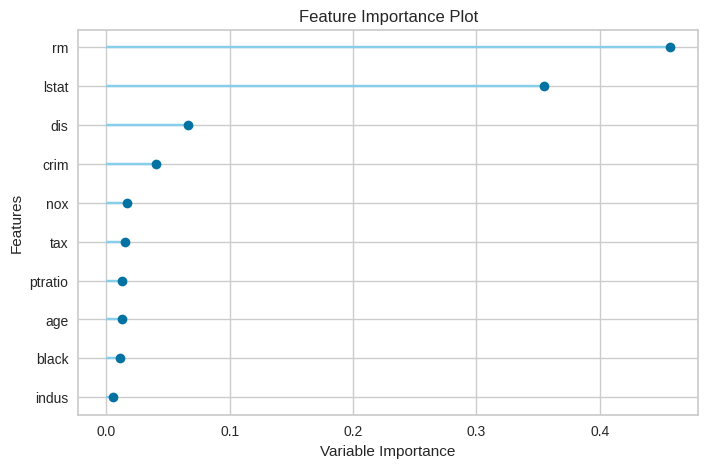

In [18]:
from pycaret.datasets import get_data
from pycaret.regression import *

myDataSet = get_data("boston", verbose = False)
setup(data = myDataSet, target='medv', verbose = False)

rfModel = create_model('rf', verbose = False)

plot_model(rfModel, plot = 'feature')

---
### **3.3 Model performance using "Feature Selection"**
---

In [19]:
from pycaret.datasets import get_data
from pycaret.regression import *
myDataSet = get_data("boston", verbose = False)

setup(data = myDataSet, target = 'medv',
      feature_selection = True,
      feature_selection_method = 'univariate',
      n_features_to_select = 0.2,
      verbose = False)

cm = compare_models()


# Re-run the code again for different parameters
# feature_selection_method = {univariate, classic, sequential}
# n_features_to_select = {0.1, 0.2, 0.3, 0.4, 0.5, ..... }

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
knn,K Neighbors Regressor,3.1585,22.0450,4.5618,0.6957,0.2077,0.1623,0.0280
lightgbm,Light Gradient Boosting Machine,3.2592,22.9966,4.7244,0.6794,0.2156,0.1681,0.2480
gbr,Gradient Boosting Regressor,3.1851,23.8697,4.7719,0.6693,0.2249,0.1723,0.0880
rf,Random Forest Regressor,3.2565,24.7172,4.8574,0.6607,0.2260,0.1739,0.1670
et,Extra Trees Regressor,3.3244,25.1186,4.8738,0.6583,0.2334,0.1780,0.1180
ada,AdaBoost Regressor,3.5928,25.9034,5.0097,0.6381,0.2284,0.1923,0.0910
xgboost,Extreme Gradient Boosting,3.6321,29.0810,5.3162,0.5901,0.2549,0.1979,0.0590
br,Bayesian Ridge,3.9228,31.7629,5.5928,0.5524,0.2929,0.2045,0.0300
ridge,Ridge Regression,3.9160,31.7268,5.5896,0.5524,0.2935,0.2046,0.0280
lar,Least Angle Regression,3.9139,31.7350,5.5904,0.5520,0.2940,0.2047,0.0300


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **3.3 Model performance using "Outlier Removal"**
---

In [20]:
from pycaret.datasets import get_data
from pycaret.regression import *
myDataSet = get_data("boston", verbose = False)

setup(data = myDataSet, target = 'medv',
      remove_outliers = True,
      outliers_method = "iforest",
      outliers_threshold = 0.05,
      verbose = False)

cm = compare_models()

# Re-run the code again for different parameters
# outliers_threshold = {0.04, 0.05, 0.06, 0.07, 0.08, ....}
# outliers_method = {iforest, ee, lof}

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,2.1417,10.3823,3.1297,0.8808,0.1416,0.1070,0.3770
gbr,Gradient Boosting Regressor,2.1527,10.8838,3.1685,0.8774,0.1446,0.1094,0.1940
xgboost,Extreme Gradient Boosting,2.2922,12.0712,3.3802,0.8619,0.1523,0.1168,0.2020
lightgbm,Light Gradient Boosting Machine,2.3082,12.4757,3.4262,0.8577,0.1513,0.1153,0.3190
rf,Random Forest Regressor,2.3722,14.5507,3.6788,0.8320,0.1572,0.1170,0.3520
ada,AdaBoost Regressor,2.7221,15.5608,3.8259,0.8229,0.1788,0.1429,0.2110
lar,Least Angle Regression,3.4117,23.9309,4.7964,0.7198,0.2634,0.1657,0.1490
lr,Linear Regression,3.3891,24.6221,4.8593,0.7128,0.2512,0.1632,0.1340
ridge,Ridge Regression,3.3898,24.8085,4.8735,0.7108,0.2496,0.1634,0.2260
br,Bayesian Ridge,3.4275,25.1331,4.9195,0.7065,0.2477,0.1646,0.1410


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **3.4 Model performance using "Transformation"**
---

In [21]:
from pycaret.datasets import get_data
from pycaret.regression import *
myDataSet = get_data("boston", verbose = False)

setup(data = myDataSet, target = 'medv',transformation = True,transformation_method = 'yeo-johnson')

cm = compare_models()

# transformation_method = {yeo-johnson, quantile}

,Description,Value
0,Session id,1307
1,Target,medv
2,Target type,Regression
3,Original data shape,"(506, 14)"
4,Transformed data shape,"(506, 14)"
5,Transformed train set shape,"(354, 14)"
6,Transformed test set shape,"(152, 14)"
7,Numeric features,13
8,Preprocess,True
9,Imputation type,simple


,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,2.2388,11.6101,3.2350,0.8665,0.1439,0.1125,0.1520
gbr,Gradient Boosting Regressor,2.3688,11.6503,3.2952,0.8651,0.1530,0.1209,0.1280
rf,Random Forest Regressor,2.4053,12.5222,3.3868,0.8605,0.1548,0.1236,0.2190
xgboost,Extreme Gradient Boosting,2.4058,12.9443,3.4301,0.8500,0.1560,0.1219,0.1660
lightgbm,Light Gradient Boosting Machine,2.4663,14.8284,3.6676,0.8363,0.1611,0.1236,0.4590
ada,AdaBoost Regressor,2.9503,16.9939,3.9646,0.8098,0.1814,0.1547,0.1000
lr,Linear Regression,3.3868,21.7916,4.5654,0.7494,0.2280,0.1774,0.0360
lar,Least Angle Regression,3.5187,22.8771,4.6932,0.7339,0.2410,0.1837,0.0420
br,Bayesian Ridge,3.5627,23.4466,4.7329,0.7334,0.2344,0.1844,0.0570
ridge,Ridge Regression,3.5783,23.6999,4.7748,0.7299,0.2272,0.1818,0.0380


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **3.5 Model performance using "PCA"**
---

In [22]:
from pycaret.datasets import get_data
from pycaret.regression import *
myDataSet = get_data("boston", verbose = False)

setup(data = myDataSet, target = 'medv',
      pca = True,
      pca_method = 'linear',
      verbose = False)

cm = compare_models()

# Re-run the code again for different parameters
# pca_method = (linear, kernel, incremental)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,2.5692,14.0379,3.6308,0.8330,0.1635,0.1299,0.2190
gbr,Gradient Boosting Regressor,2.8139,17.0870,4.0561,0.7854,0.1734,0.1391,0.1140
lightgbm,Light Gradient Boosting Machine,2.9894,18.8954,4.2731,0.7537,0.1897,0.1515,0.2980
rf,Random Forest Regressor,2.8894,19.3960,4.3206,0.7510,0.1843,0.1443,0.2190
ada,AdaBoost Regressor,3.5134,22.1417,4.6255,0.7336,0.2100,0.1868,0.0850
xgboost,Extreme Gradient Boosting,3.2010,21.9443,4.5767,0.7263,0.1960,0.1565,0.2090
ridge,Ridge Regression,3.5290,25.6157,4.9831,0.6939,0.2634,0.1779,0.0230
lr,Linear Regression,3.5517,25.3607,4.9701,0.6936,0.2665,0.1782,0.0240
lar,Least Angle Regression,3.5517,25.3607,4.9701,0.6936,0.2665,0.1782,0.0220
br,Bayesian Ridge,3.5884,26.3943,5.0599,0.6851,0.2580,0.1795,0.0190


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **3.6 Model performance using "Outlier Removal" + "Normalization"**
---

In [23]:
from pycaret.datasets import get_data
from pycaret.regression import *
myDataSet = get_data("boston", verbose = False)

setup(data = myDataSet, target = 'medv',
      remove_outliers = True,
      outliers_threshold = 0.05,
      normalize = True,
      normalize_method = 'zscore',
      data_split_shuffle = False,
      fold = 2,
      verbose = False)

cm = compare_models()


# Question: Does order of the data preprocessing matters ???

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
ridge,Ridge Regression,2.7846,14.8161,3.8467,0.7403,0.1697,0.1177,0.1200
br,Bayesian Ridge,2.7956,15.0080,3.8734,0.7390,0.1690,0.1172,0.1250
lr,Linear Regression,2.7930,14.8978,3.8557,0.7378,0.1710,0.1185,0.1250
et,Extra Trees Regressor,2.9750,15.1194,3.8857,0.7349,0.1556,0.1328,0.1950
huber,Huber Regressor,2.9005,15.9907,3.9875,0.7326,0.1605,0.1167,0.1250
omp,Orthogonal Matching Pursuit,3.0180,16.0629,4.0065,0.7257,0.1616,0.1282,0.1200
gbr,Gradient Boosting Regressor,3.1249,17.9674,4.2222,0.7013,0.1626,0.1351,0.1650
rf,Random Forest Regressor,3.2884,19.0047,4.3553,0.6779,0.1699,0.1444,0.3950
ada,AdaBoost Regressor,3.3373,20.4519,4.5026,0.6607,0.1712,0.1437,0.1750
lightgbm,Light Gradient Boosting Machine,3.3520,22.0304,4.5640,0.6559,0.1656,0.1365,0.1400


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **3.7 Model performance using "Outlier Removal" +  "Normalization" + "Transformation"**
---

In [30]:
from pycaret.datasets import get_data
from pycaret.regression import *
myDataSet = get_data("boston", verbose = False)

setup(data = myDataSet, target = 'medv',
      remove_outliers = True,
      outliers_threshold = 0.05,
      normalize = True,
      normalize_method = 'zscore',
      transformation = True,
      transformation_method = 'yeo-johnson',
      data_split_shuffle = False,
      fold = 2,
      verbose = False)

cm = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,3.0273,15.7741,3.9716,0.7268,0.1581,0.1350,0.2450
lightgbm,Light Gradient Boosting Machine,3.2757,19.6552,4.3706,0.6842,0.1629,0.1367,0.2850
br,Bayesian Ridge,3.1368,18.5574,4.3062,0.6833,0.2184,0.1301,0.1450
ridge,Ridge Regression,3.1573,18.5653,4.3087,0.6798,0.2296,0.1321,0.1800
rf,Random Forest Regressor,3.2622,19.0947,4.3629,0.6780,0.1689,0.1426,0.2600
lr,Linear Regression,3.1750,18.6304,4.3162,0.6774,0.2356,0.1333,0.1550
lar,Least Angle Regression,3.1750,18.6304,4.3162,0.6774,0.2356,0.1333,0.3150
gbr,Gradient Boosting Regressor,3.3432,20.4982,4.5139,0.6575,0.1727,0.1451,0.2200
ada,AdaBoost Regressor,3.4426,20.8464,4.5586,0.6485,0.1757,0.1509,0.2100
huber,Huber Regressor,3.2986,22.0813,4.6497,0.6417,0.2236,0.1291,0.1450


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

---
### **3.8 Explore more parameters of "setup()" on pycaret**
---
- Explore setup() paramaeters in **Step 1.3**
- **<a href="https://pycaret.readthedocs.io/en/latest/api/regression.html" target="_blank"> Click Here</a>** for more (Right Click on the link and click on "Open Link in New Window")

---
# **4. Regression: More Operations**
---
### **4.1 Build a single model - "RandomForest"**

In [25]:
from pycaret.datasets import get_data
from pycaret.regression import *
mydataset=get_data("boston")
setup(data=mydataset,target="medv",train_size=0.7,data_split_shuffle=True,verbose=True)
rfmodel=create_model("rf")

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


,Description,Value
0,Session id,8068
1,Target,medv
2,Target type,Regression
3,Original data shape,"(506, 14)"
4,Transformed data shape,"(506, 14)"
5,Transformed train set shape,"(354, 14)"
6,Transformed test set shape,"(152, 14)"
7,Numeric features,13
8,Preprocess,True
9,Imputation type,simple


,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,2.3013,7.9498,2.8195,0.9099,0.1459,0.1223
1,2.7772,28.9923,5.3845,0.7258,0.1857,0.1227
2,1.5247,4.1659,2.0411,0.9537,0.0909,0.0731
3,2.9781,23.7130,4.8696,0.4800,0.2128,0.1682
4,2.2633,7.7080,2.7763,0.8688,0.1539,0.1263
5,2.4841,16.1375,4.0171,0.8822,0.1326,0.1067
6,2.3757,9.8181,3.1334,0.8812,0.1733,0.1460
7,2.1112,13.9689,3.7375,0.7992,0.1583,0.1097
8,1.7297,4.3850,2.0940,0.9459,0.0944,0.0816


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

---
### **4.2 Other available regression models**
---
-	'ada' - AdaBoost Regressor
-	'br' - Bayesian Ridge
-	'dt' - Decision Tree Regressor
-	'en'	- Elastic Net
-	'et' - Extra Trees Regressor
-	'gbr' - Gradient Boosting Regressor
-	'huber' - Huber Regressor
-	'knn' - K Neighbors Regressor
-	'llar' - Lasso Least Angle Regression
-	'lasso' - Lasso Regression
-	'lar' - Least Angle Regression
-	'lightgbm'	- Light Gradient Boosting Machine
-	'lr' - Linear Regression
-	'omp' - Orthogonal Matching Pursuit
-	'par' - Passive Aggressive Regressor
-	'rf' - Random Forest Regressor
-	'ridge' - Ridge Regression

---
### **4.3 Explore more parameters of "create_model()" on pycaret**
---

**<a href="https://pycaret.readthedocs.io/en/latest/api/regression.html#pycaret.regression.create_model" target="_blank"> Click Here</a>**

---
### **4.4 Make prediction on the "new unseen dataset"**
---
#### **Get the "new unseen dataset"**



In [32]:
# Select top 10 rows from boston dataset
newdataset=mydataset.iloc[:10]

#### **Make prediction on "new unseen dataset"**

In [34]:
newPredictions = predict_model(rfModel, data = newdataset)
newPredictions

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Random Forest Regressor,16.1111,303.1322,17.4107,-6.3040,0.5486,0.7159


,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv,prediction_label
0,0.00632,18.0,2.31,0,0.538,6.575,65.199997,4.0900,1,296,15.300000,396.899994,4.98,24.000000,43.051
1,0.02731,0.0,7.07,0,0.469,6.421,78.900002,4.9671,2,242,17.799999,396.899994,9.14,21.600000,42.294
2,0.02729,0.0,7.07,0,0.469,7.185,61.099998,4.9671,2,242,17.799999,392.829987,4.03,34.700001,42.294
3,0.03237,0.0,2.18,0,0.458,6.998,45.799999,6.0622,3,222,18.700001,394.630005,2.94,33.400002,42.294
4,0.06905,0.0,2.18,0,0.458,7.147,54.200001,6.0622,3,222,18.700001,396.899994,5.33,36.200001,42.294
5,0.02985,0.0,2.18,0,0.458,6.430,58.700001,6.0622,3,222,18.700001,394.119995,5.21,28.700001,42.294
6,0.08829,12.5,7.87,0,0.524,6.012,66.599998,5.5605,5,311,15.200000,395.600006,12.43,22.900000,42.594
7,0.14455,12.5,7.87,0,0.524,6.172,96.099998,5.9505,5,311,15.200000,396.899994,19.15,27.100000,42.594
8,0.21124,12.5,7.87,0,0.524,5.631,100.000000,6.0821,5,311,15.200000,386.630005,29.93,16.500000,42.808
9,0.17004,12.5,7.87,0,0.524,6.004,85.900002,6.5921,5,311,15.200000,386.709991,17.10,18.900000,42.594


---
### **4.5 "Scatter plot" b/w actual and predicted**
---

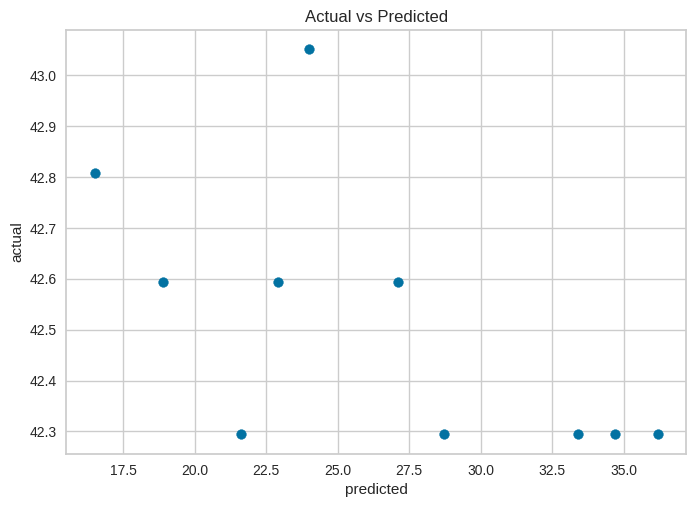

In [35]:
import matplotlib.pyplot as plt

predicted=newPredictions.iloc[:,-1]
actual=newPredictions.iloc[:,-2]
plt.scatter(actual,predicted)
plt.xlabel("predicted")
plt.ylabel("actual")
plt.title("Actual vs Predicted")
plt.savefig("result-scatter-plot.jpg",dpi=300)
plt.show()

---
### **4.6 "Save" the prediction result**
---

In [36]:
from google.colab import files

newPredictions.to_csv("newPredictions.csv")
files.download("newPredictions.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

4.6.2 Downloading Graphs

In [37]:
from google.colab import files
files.download("result-scatter-plot.jpg")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---
### **4.7 "Save" the trained model**
---

In [38]:
sm=save_model(rfModel,"rfModelfile")

Transformation Pipeline and Model Successfully Saved


**Download the Trained Model**

In [39]:
files.download("rfModelfile.pkl")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

---
### **4.8  "Upload the trained model" --> "Load the model"  --> "Make the prediction" on "new unseen dataset"**
---
### **4.8.1 Upload the  "Trained Model"**


In [40]:
from google.colab import files
files.upload()

Saving rfModelfile (1).pkl to rfModelfile (1).pkl


{'rfModelfile (1).pkl': b'\x80\x04\x95"\x02\x00\x00\x00\x00\x00\x00\x8c\x19pycaret.internal.pipeline\x94\x8c\x08Pipeline\x94\x93\x94)\x81\x94}\x94(\x8c\x05steps\x94]\x94(\x8c\x11numerical_imputer\x94\x8c(pycaret.internal.preprocess.transformers\x94\x8c\x12TransformerWrapper\x94\x93\x94)\x81\x94}\x94(\x8c\x0btransformer\x94\x8c\x14sklearn.impute._base\x94\x8c\rSimpleImputer\x94\x93\x94)\x81\x94}\x94(\x8c\x0emissing_values\x94G\x7f\xf8\x00\x00\x00\x00\x00\x00\x8c\radd_indicator\x94\x89\x8c\x13keep_empty_features\x94\x89\x8c\x08strategy\x94\x8c\x04mean\x94\x8c\nfill_value\x94N\x8c\x04copy\x94\x88\x8c\x11feature_names_in_\x94\x8c\x13joblib.numpy_pickle\x94\x8c\x11NumpyArrayWrapper\x94\x93\x94)\x81\x94}\x94(\x8c\x08subclass\x94\x8c\x05numpy\x94\x8c\x07ndarray\x94\x93\x94\x8c\x05shape\x94K\r\x85\x94\x8c\x05order\x94\x8c\x01C\x94\x8c\x05dtype\x94h!\x8c\x05dtype\x94\x93\x94\x8c\x02O8\x94\x89\x88\x87\x94R\x94(K\x03\x8c\x01|\x94NNNJ\xff\xff\xff\xffJ\xff\xff\xff\xffK?t\x94b\x8c\nallow_mmap\x94\x8

---
### **4.8.2 Load the "Model"**
---

In [41]:
rfModel=load_model("rfModelfile (1)")

Transformation Pipeline and Model Successfully Loaded


---
### **4.8.3 Make the prediction on "new unseen dataset"**
---

In [42]:
newPredictions=predict_model(rfModel,data=newdataset)
newPredictions

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Random Forest Regressor,16.1111,303.1322,17.4107,-6.3040,0.5486,0.7159


,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,black,lstat,medv,prediction_label
0,0.00632,18.0,2.31,0,0.538,6.575,65.199997,4.0900,1,296,15.300000,396.899994,4.98,24.000000,43.051
1,0.02731,0.0,7.07,0,0.469,6.421,78.900002,4.9671,2,242,17.799999,396.899994,9.14,21.600000,42.294
2,0.02729,0.0,7.07,0,0.469,7.185,61.099998,4.9671,2,242,17.799999,392.829987,4.03,34.700001,42.294
3,0.03237,0.0,2.18,0,0.458,6.998,45.799999,6.0622,3,222,18.700001,394.630005,2.94,33.400002,42.294
4,0.06905,0.0,2.18,0,0.458,7.147,54.200001,6.0622,3,222,18.700001,396.899994,5.33,36.200001,42.294
5,0.02985,0.0,2.18,0,0.458,6.430,58.700001,6.0622,3,222,18.700001,394.119995,5.21,28.700001,42.294
6,0.08829,12.5,7.87,0,0.524,6.012,66.599998,5.5605,5,311,15.200000,395.600006,12.43,22.900000,42.594
7,0.14455,12.5,7.87,0,0.524,6.172,96.099998,5.9505,5,311,15.200000,396.899994,19.15,27.100000,42.594
8,0.21124,12.5,7.87,0,0.524,5.631,100.000000,6.0821,5,311,15.200000,386.630005,29.93,16.500000,42.808
9,0.17004,12.5,7.87,0,0.524,6.004,85.900002,6.5921,5,311,15.200000,386.709991,17.10,18.900000,42.594


---
# **5. Plot the trained model**
---
**Following parameters can be plot for a trained model**

- Prediction Error Plot    - 'error'
- Learning Curve           - 'learning'
- Validation Curve         - 'vc'
- Feature Importance       - 'feature'
- Model Hyperparameter     - 'parameter'

---
### **5.1 Create RandomForest model or any other model**
---

In [43]:
rfModel = create_model('rf')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.1695,16.9623,4.1185,0.6456,0.1924,0.1710
1,3.3548,21.2271,4.6073,0.7105,0.1453,0.1141
Mean,3.2622,19.0947,4.3629,0.6780,0.1689,0.1426
Std,0.0927,2.1324,0.2444,0.0324,0.0236,0.0285


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

---
### **5.2 Plot the "error"**
---

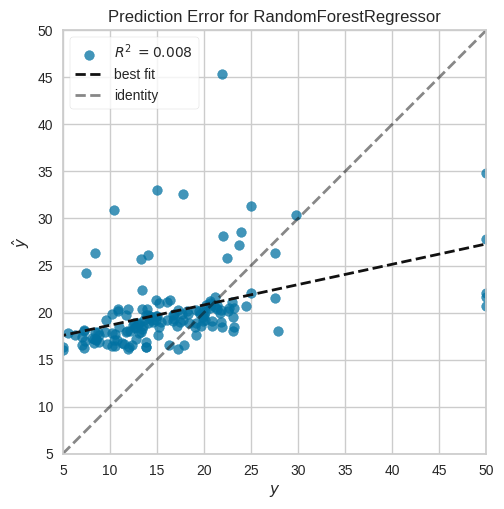

In [45]:
plot_model(rfModel, plot='error')

---
### **5.3 Plot the "learning curve"**
---

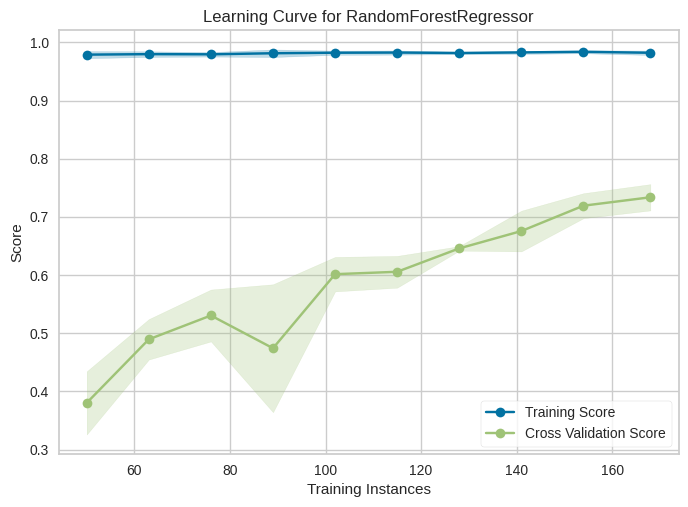

In [46]:
plot_model(rfModel, plot='learning')

---
### **5.4 Plot the "validation curve"**
---

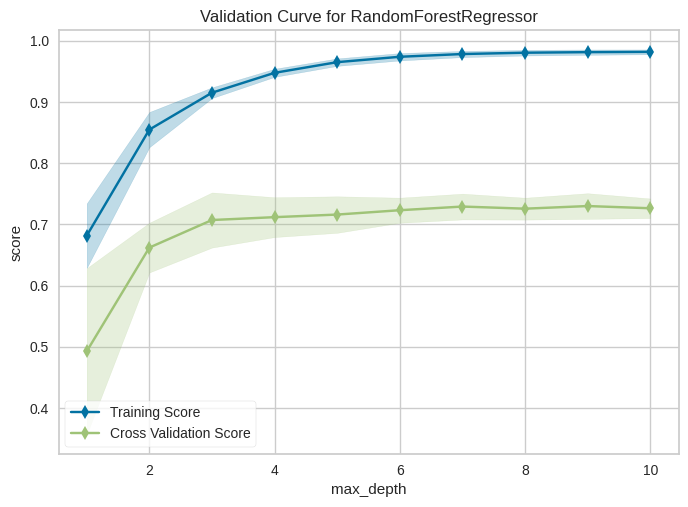

In [47]:
plot_model(rfModel, plot='vc')

---
### **5.5 Get the model "parameters"**
---

In [48]:
plot_model(rfModel, plot='parameter')

,Parameters
bootstrap,True
ccp_alpha,0.0
criterion,squared_error
max_depth,None
max_features,1.0
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2


---
### **5.6 Explore the more parameters of "plot_model()" on pycaret**
---
**<a href="https://pycaret.readthedocs.io/en/latest/api/regression.html#pycaret.regression.plot_model" target="_blank"> Click Here </a>**

---
# **6. Feature Importance**
---
### **6.1 Feature Importance using "Random Forest"**


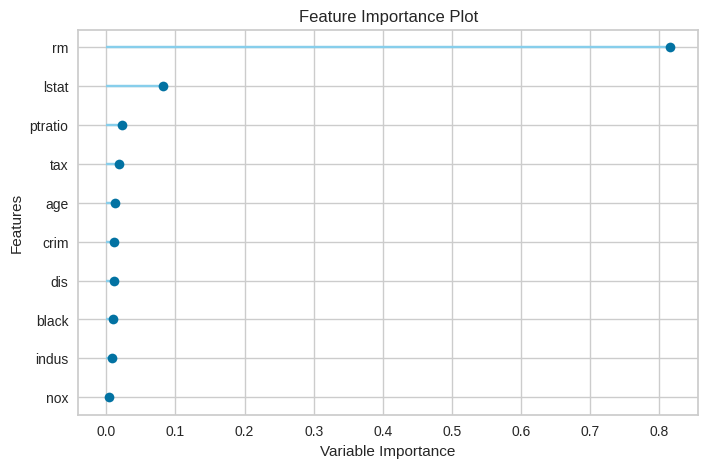

In [49]:
rfModel = create_model('rf', verbose=False)
plot_model(rfModel, plot='feature')

---
### **6.2 Feature Importance using "Extra Trees Regressor"**
---

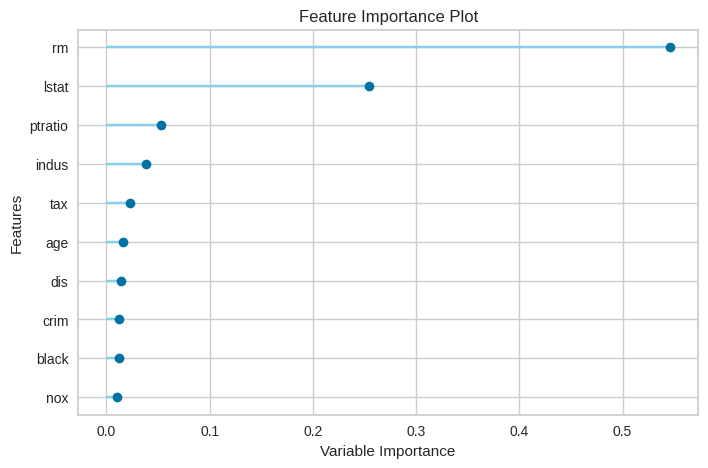

In [50]:
etModel = create_model('et', verbose=False)
plot_model(etModel, plot='feature')

---
### **6.3 Feature Importance using "Decision Tree"**
---

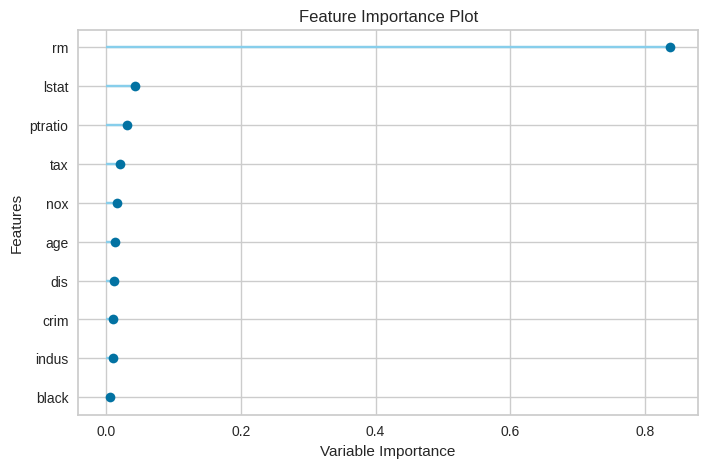

In [51]:
dtModel = create_model('dt', verbose=False)
plot_model(dtModel, plot='feature')

---
# **7. Tune/Optimize the model performance**
---
### **7.1 Train "Decision Tree" with default parameters**


In [52]:
dtModel = create_model('dt')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.6215,20.9027,4.5719,0.5633,0.2111,0.1943
1,5.0237,46.5365,6.8218,0.3653,0.2088,0.1698
Mean,4.3226,33.7196,5.6969,0.4643,0.2100,0.1821
Std,0.7011,12.8169,1.1249,0.0990,0.0011,0.0123


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

#### **Get the "parameters" of Decision Tree**

In [53]:
plot_model(dtModel, plot = 'parameter')

,Parameters
ccp_alpha,0.0
criterion,squared_error
max_depth,None
max_features,None
max_leaf_nodes,None
min_impurity_decrease,0.0
min_samples_leaf,1
min_samples_split,2
min_weight_fraction_leaf,0.0
monotonic_cst,None


---
### **7.2 Tune "Decision Tree" model**
---

In [54]:
dtModelTuned = tune_model(dtModel, n_iter = 200)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
Fold,,,,,,
0,3.0955,16.3530,4.0439,0.6583,0.1892,0.1664
1,3.3994,20.4935,4.5270,0.7205,0.1629,0.1240
Mean,3.2475,18.4233,4.2854,0.6894,0.1761,0.1452
Std,0.1520,2.0703,0.2415,0.0311,0.0132,0.0212


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 2 folds for each of 200 candidates, totalling 400 fits


#### **Get the "tuned parameters" of Decision Tree**

In [55]:
plot_model(dtModelTuned, plot = 'parameter')

,Parameters
ccp_alpha,0.0
criterion,absolute_error
max_depth,15
max_features,1.0
max_leaf_nodes,None
min_impurity_decrease,0.1
min_samples_leaf,5
min_samples_split,9
min_weight_fraction_leaf,0.0
monotonic_cst,None


---
### **7.3 Explore more parameters of "tune_model()" on pycaret**
---
**<a href="https://pycaret.readthedocs.io/en/latest/api/regression.html#pycaret.regression.tune_model" target="_blank"> Click Here </a>**

---
# **8. AutoML - Advanced Machine Learning**
---

- Select n Best Models:
  - Ensemble, Stacking, Begging, Blending
  - Auto tune the best n models

**<a href="https://pycaret.readthedocs.io/en/latest/api/regression.html#pycaret.regression.automl" target="_blank">Click Here</a>**


---
# **9. Deploy the model on AWS / Azure**
---
**<a href="https://pycaret.readthedocs.io/en/latest/api/regression.html#pycaret.regression.deploy_model" target="_blank">Click Here</a>**


In [56]:
def clean_notebook_for_github(notebook_filename):
    """
    Cleans notebook metadata so it displays correctly on GitHub.
    Example: clean_notebook_for_github('MyNotebook.ipynb')
    """
    !pip install -q nbstripout &> /dev/null
    print(f"\nCleaning notebook: {notebook_filename}\n")
    !nbstripout {notebook_filename}
    print("\n✅ Done! You can now push to GitHub — it will render correctly.\n")

clean_notebook_for_github('/content/01-Regression.ipynb')


Cleaning notebook: /content/01-Regression.ipynb

Could not strip '/content/01-Regression.ipynb': file not found

✅ Done! You can now push to GitHub — it will render correctly.

